# Understanding Resnet Model Features

We know that the Resnet model works well, but why does it work? How can we have confidence that it is searching out the correct features? A recent paper, [Axiomatic Attribution for Deep Networks](https://arxiv.org/pdf/1703.01365.pdf), shows that averaging gradients taken along a path of images from a blank image (e.g. pure black or grey) to the actual image, can robustly predict sets of pixels that have a strong impact on the overall classification of the image. The below code shows how to modify the TF estimator code to analyze model behavior of different images.

In [1]:
import csv
import io
import matplotlib.pyplot as plt
import numpy as np
import os
import pickle
import requests
import tensorflow as tf

from io import BytesIO
from PIL import Image
from subprocess import call

# Constants

In [2]:
_DEFAULT_IMAGE_SIZE = 224
_NUM_CHANNELS = 3
_LABEL_CLASSES = 1001

RESNET_SIZE = 50  # We're loading a resnet-50 saved model.

# Model directory
MODEL_DIR='resnet_model_checkpoints'
VIS_DIR='visualization'

# RIEMANN STEPS is the number of steps in a Riemann Sum.
# This is used to compute an approximate the integral of gradients by supplying
# images on the path from a blank image to the original image.
RIEMANN_STEPS = 30

# Return the top k classes and probabilities, so we can also visualize model inference
# against other contending classes besides the most likely class.
TOP_K = 5


# Download model checkpoint

The next step is to load the researcher's saved checkpoint into our estimator. We will download it from
http://download.tensorflow.org/models/official/resnet50_2017_11_30.tar.gz using the following commands.

In [3]:
import urllib.request

urllib.request.urlretrieve("http://download.tensorflow.org/models/official/resnet50_2017_11_30.tar.gz ", "resnet.tar.gz")

('resnet.tar.gz', <http.client.HTTPMessage at 0x7fac290f7320>)

In [4]:
#unzip the file into a directory called resnet
call(["mkdir", MODEL_DIR])
call(["tar", "-zxvf", "resnet.tar.gz", "-C", MODEL_DIR])

0

In [5]:
# Make sure you see model checkpoint files in this directory
os.listdir(MODEL_DIR)

['checkpoint', 'model.ckpt.index', 'model.ckpt.data-00000-of-00001']

# Import the Model Architecture
 
In order to reconstruct the Resnet neural network used to train the Imagenet model, we need to load the architecture pieces. During the setup step, we checked out https://github.com/tensorflow/models/tree/v1.4.0/official/resnet. We can now load functions and constants from resnet_model.py into the notebook.

In [6]:
%run ../models/official/resnet/resnet_model.py  #TODO: modify directory based on where you git cloned the TF models.

# Image preprocessing functions

Note that preprocessing functions are called during training as well (see https://github.com/tensorflow/models/blob/master/official/resnet/imagenet_main.py and https://github.com/tensorflow/models/blob/master/official/resnet/vgg_preprocessing.py), so we will need to extract relevant logic from these functions. Below is a simplified preprocessing code that normalizes the image's pixel values.

For simplicity, we assume the client provides properly-sized images 224 x 224 x 3 in batches. It will become clear later that sending images over ip in protobuf format can be more easily handled by storing a 4d tensor. The only preprocessing required here is to subtract the mean.

In [7]:
def preprocess_images(images):
  """Preprocesses the image by subtracting out the mean from all channels.
  Args:
    image: A 4D `Tensor` representing a batch of images.
  Returns:
    image pixels normalized to be between -0.5 and 0.5
  """
  return tf.to_float(images) / 255 - 0.5

# Resnet Model Functions

We are going to create two estimators here since we need to run two model predictions. 

* The first prediction computes the top labels for the image by returning the argmax_k top logits. 

* The second prediction returns a sequence of gradients along the straightline path from a purely grey image (127.5, 127.5, 127.5) to the final image. We use grey here because the resnet model transforms this pixel value to all 0s.

Below is the resnet model function.

In [8]:
def resnet_model_fn(features, labels, mode):
  """Our model_fn for ResNet to be used with our Estimator."""

  # Preprocess images as necessary for resnet
  features = preprocess_images(features['images'])

  # This network must be IDENTICAL to that used to train.
  network = imagenet_resnet_v2(RESNET_SIZE, _LABEL_CLASSES)

  # tf.estimator.ModeKeys.TRAIN will be false since we are predicting.
  logits = network(
      inputs=features, is_training=(mode == tf.estimator.ModeKeys.TRAIN))

  # Instead of the top 1 result, we can now return top k!
  top_k_logits, top_k_classes = tf.nn.top_k(logits, k=TOP_K)
  top_k_probs = tf.nn.softmax(top_k_logits)
  predictions = {
      'classes': top_k_classes,
      'probabilities': top_k_probs
  }


  return tf.estimator.EstimatorSpec(
      mode=mode,
      predictions=predictions, 
  )


# Gradients Model Function

The Gradients model function takes as input a single image (a 4d tensor of dimension [1, 244, 244, 3]) and expands it to a series of images (tensor dimension [RIEMANN_STEPS + 1, 244, 244, 3]), where each image is simply a "fractional" image, with image 0 being pure gray to image RIEMANN_STEPS being the original image. The gradients are then computed for each of these images, and various outputs are returned.

**Note:** Each step is a single inference that returns an entire gradient pixel map.
The total gradient map evaluation can take a couple minutes!


In [9]:
def gradients_model_fn(features, labels, mode):
  """Our model_fn for ResNet to be used with our Estimator."""
    
  # Supply the most likely class from features dict to determine which logit function
  # to use gradients along the
  most_likely_class = features['most_likely_class']
    
  # Features here is a 4d tensor of ONE image. Normalize it as in training and serving.
  features = preprocess_images(features['images'])

  # This network must be IDENTICAL to that used to train.
  network = imagenet_resnet_v2(RESNET_SIZE, _LABEL_CLASSES)

  # path_features should have dim [RIEMANN_STEPS + 1, 224, 224, 3]
  path_features = tf.zeros([1, 224, 224, 3])
  for i in range(1, RIEMANN_STEPS + 1):
    path_features = tf.concat([path_features, features * i / RIEMANN_STEPS], axis=0)
   
  # Path logits should evaluate logits for each path feature and return a 2d array for all path images and classes
  path_logits = network(inputs=path_features, is_training=(mode == tf.estimator.ModeKeys.TRAIN))

  # The logit we care about is only that pertaining to the most likely class
  # The most likely class contains only a single integer, so retrieve it.
  target_logits = path_logits[:, most_likely_class[0]]
   
  # Compute gradients for each image with respect to each logit
  gradients = tf.gradients(target_logits, path_features)
    
  # Multiply elementwise to the original image to get weighted gradients for each pixel.
  gradients = tf.squeeze(tf.multiply(gradients, features))
    
  predictions = {
      'path_features': path_features,  # for debugging
      'path_logits': path_logits,  # for debugging
      'target_logits': target_logits,  # use this to verify that the riemann integral works out
      'path_features': path_features, # for displaying path images
      'gradients': gradients  # for displaying gradient images and computing integrated gradient
  }


  return tf.estimator.EstimatorSpec(
    mode=mode,
    predictions=predictions,  # This is the returned value
  )


# Estimators

Load in the model_fn using the checkpoints from MODEL_DIR. This will initialize our weights which we will then use to run backpropagation to find integrated gradients.

In [10]:
# Load this model into our estimator
resnet_estimator = tf.estimator.Estimator(
  model_fn=resnet_model_fn,  # Call our generate_model_fn to create model function
  model_dir=MODEL_DIR,  # Where to look for model checkpoints
  #config not needed
)

gradients_estimator = tf.estimator.Estimator(
  model_fn=gradients_model_fn,  # Call our generate_model_fn to create model function
  model_dir=MODEL_DIR,  # Where to look for model checkpoints
  #config not needed
)

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'resnet_model_checkpoints', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': None, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7fac290f70f0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'resnet_model_checkpoints', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': None, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_

# Create properly sized image in numpy

Load whatever image you would like (local or url), and resize to 224 x 224 x 3 using opencv2.

In [11]:
def resize_and_pad_image(img, output_image_dim):
  """Resize the image to make it IMAGE_DIM x IMAGE_DIM pixels in size.

  If an image is not square, it will pad the top/bottom or left/right
  with black pixels to ensure the image is square.

  Args:
    img: the input 3-color image
    output_image_dim: resized and padded output length (and width)

  Returns:
    resized and padded image
  """

  old_size = img.size  # old_size[0] is in (width, height) format

  ratio = float(output_image_dim) / max(old_size)
  new_size = tuple([int(x * ratio) for x in old_size])
  # use thumbnail() or resize() method to resize the input image

  # thumbnail is a in-place operation

  # im.thumbnail(new_size, Image.ANTIALIAS)

  scaled_img = img.resize(new_size, Image.ANTIALIAS)
  # create a new image and paste the resized on it

  padded_img = Image.new("RGB", (output_image_dim, output_image_dim))
  padded_img.paste(scaled_img, ((output_image_dim - new_size[0]) // 2,
                    (output_image_dim - new_size[1]) // 2))

  return padded_img

In [12]:
IMAGE_PATH = 'https://www.popsci.com/sites/popsci.com/files/styles/1000_1x_/public/images/2017/09/depositphotos_33210141_original.jpg?itok=MLFznqbL&fc=50,50'
IMAGE_NAME = os.path.splitext(os.path.basename(IMAGE_PATH))[0]
print(IMAGE_NAME)

depositphotos_33210141_original


In [13]:
image = None
if 'http' in IMAGE_PATH:
  resp = requests.get(IMAGE_PATH)
  image = Image.open(BytesIO(resp.content))
else:
  image = Image.open(IMAGE_PATH)  # Parse the image from your local disk.
# Resize and pad the image
image = resize_and_pad_image(image, _DEFAULT_IMAGE_SIZE)
feature = np.asarray(image)
feature = np.array([feature])

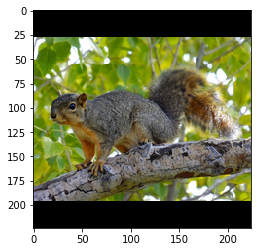

In [14]:
# Display the image to validate
imgplot = plt.imshow(feature[0])
plt.show()

# Prediction Input Function

Since we are analyzing the model using the estimator api, we need to provide an input function for prediction. Fortunately, there are built-in input functions that can read from numpy arrays, e.g. tf.estimator.inputs.numpy_input_fn.

In [15]:
label_predictions = resnet_estimator.predict(
    tf.estimator.inputs.numpy_input_fn(
        x={'images': feature},
        shuffle=False
    )
)

label_dict = next(label_predictions)


INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from resnet_model_checkpoints/model.ckpt
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


In [16]:
# Print out probabilities and class names
classval = label_dict['classes']
probsval = label_dict['probabilities']
labels = []
with open('client/imagenet1000_clsid_to_human.txt', 'r') as f:
  label_reader = csv.reader(f, delimiter=':', quotechar='\'')
  for row in label_reader:
    labels.append(row[1][:-1])
# The served model uses 0 as the miscellaneous class, and so starts indexing
# the imagenet images from 1. Subtract 1 to reference the text correctly.
classval = [labels[x - 1] for x in classval]
class_and_probs = [str(p) + ' : ' + c for c, p in zip(classval, probsval)]
for j in range(0, 5):
  print(class_and_probs[j])

0.9679089 :  'fox squirrel, eastern fox squirrel, Sciurus niger'
0.0107902475 :  'titi, titi monkey'
0.008617849 :  'corn'
0.0067643495 :  'web site, website, internet site, site'
0.0059186635 :  'marmot'


# Computing Gradients

Run the gradients estimator to retrieve a generator of metrics and gradient pictures, and pickle the images. 

In [17]:
# make the visualization directory
IMAGE_DIR = os.path.join(VIS_DIR, IMAGE_NAME)
call(['mkdir', '-p', IMAGE_DIR])


0

In [18]:
# Get one of the top classes. 0 picks out the best, 1 picks out second best, etc...
best_label = label_dict['classes'][0]

# Compute gradients with respect to this class
gradient_predictions = gradients_estimator.predict(
    tf.estimator.inputs.numpy_input_fn(
        x={'images': feature, 'most_likely_class': np.array([best_label])},
        shuffle=False
    )
)

# Start computing the sum of gradients (to be used for integrated gradients)
int_gradients = np.zeros((224, 224, 3))
gradients_and_logits = []

# Print gradients along the path, and pickle them
for i in range(0, RIEMANN_STEPS + 1):
    gradient_dict = next(gradient_predictions)
    gradient_map = gradient_dict['gradients']
    print('Path image %d: gradient: %f, logit: %f' % (i, np.sum(gradient_map), gradient_dict['target_logits']))
    # Gradient visualization output pickles
    pickle.dump(gradient_map, open(os.path.join(IMAGE_DIR, 'path_gradient_' + str(i) + '.pkl'), "wb" ))
    int_gradients = np.add(int_gradients, gradient_map)
    gradients_and_logits.append((np.sum(gradient_map), gradient_dict['target_logits']))
    
pickle.dump(int_gradients, open(os.path.join(IMAGE_DIR, 'int_gradients.pkl'), "wb" ))
pickle.dump(gradients_and_logits, open(os.path.join(IMAGE_DIR, 'gradients_and_logits.pkl'), "wb" ))

INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from resnet_model_checkpoints/model.ckpt
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Path image 0: gradient: 18.650663, logit: -0.955318
Path image 1: gradient: -42.377331, logit: -2.953830
Path image 2: gradient: 285.623932, logit: 2.167658
Path image 3: gradient: 132.140427, logit: 10.099028
Path image 4: gradient: 23.241615, logit: 12.233699
Path image 5: gradient: -2.847548, logit: 12.108232
Path image 6: gradient: -5.027435, logit: 11.822726
Path image 7: gradient: 0.981469, logit: 11.797161
Path image 8: gradient: -1.719520, logit: 11.734380
Path image 9: gradient: -3.339175, logit: 11.693088
Path image 10: gradient: -3.388700, logit: 11.649044
Path image 11: gradient: -0.978207, logit: 11.554442
Path image 12: gradient: -1.321653, logit: 11.511113
Path image 13: gradient: -3.306393, logit: 11.402

# Visualization

If you simply want to play around with visualization, unpickle the result from above so you do not have to rerun prediction again. The following visualizes the gradients with different amplification of pixels, and prints their derivatives and logits as well to view where the biggest differentiators lie. You can also modify the INTERPOLATION flag to increase the "fatness" of pixels.

Below are two examples of visualization methods: one computing the gradient value normalized to between 0 and 1, and another visualizing absolute deviation from the median.

## Plotting individual image gradients along path

First, let us plot the individual gradient value for all gradient path images. Pay special attention to the images with a large positive gradient (i.e. in the direction of increasing logit for the most likely class). Do the pixel gradients resemble the image class you are trying to detect?

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


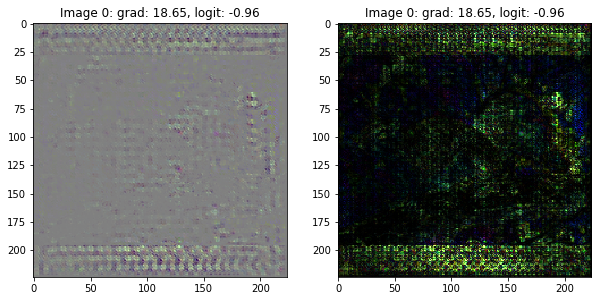

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


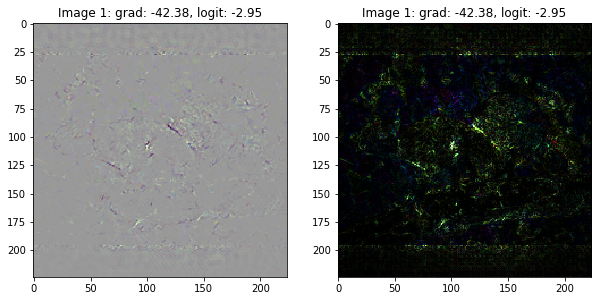

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


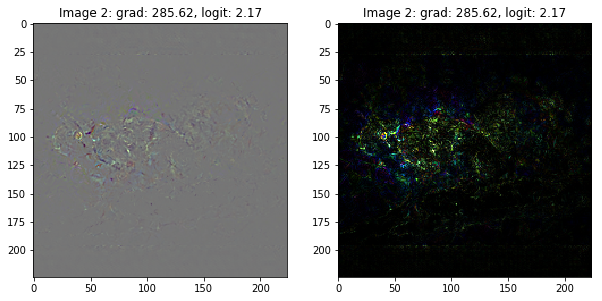

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


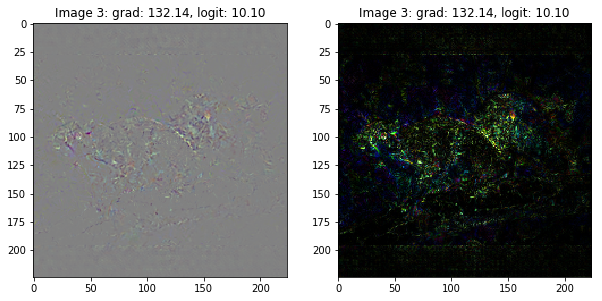

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


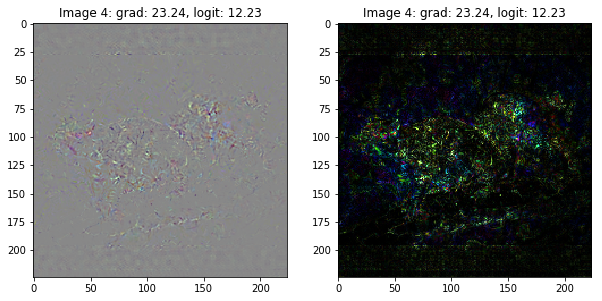

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


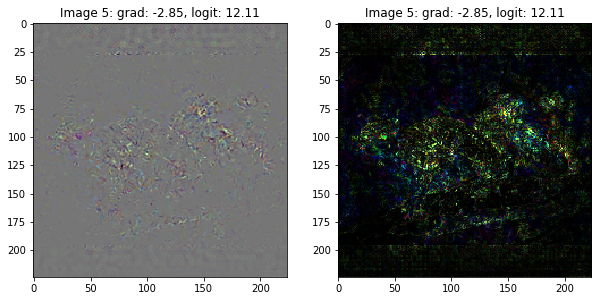

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


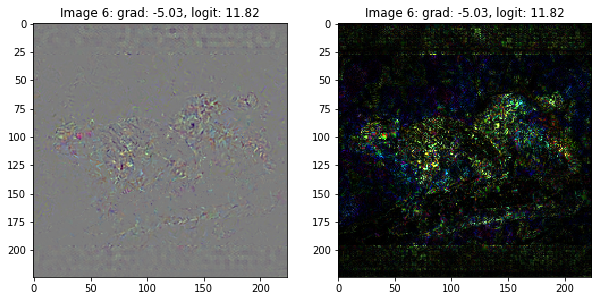

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


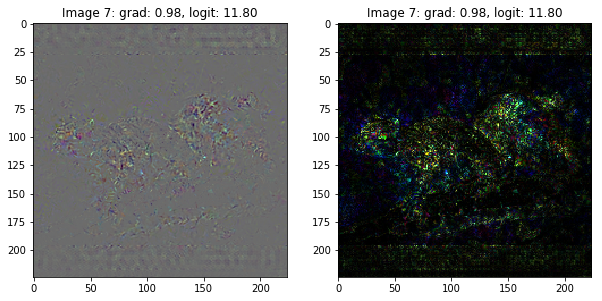

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


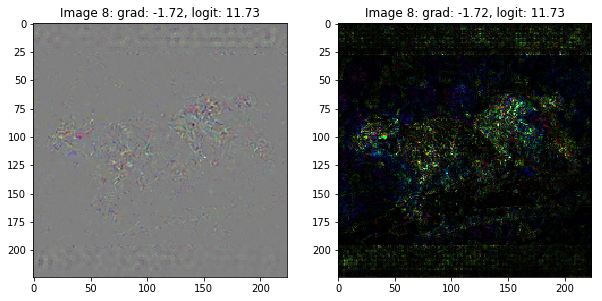

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


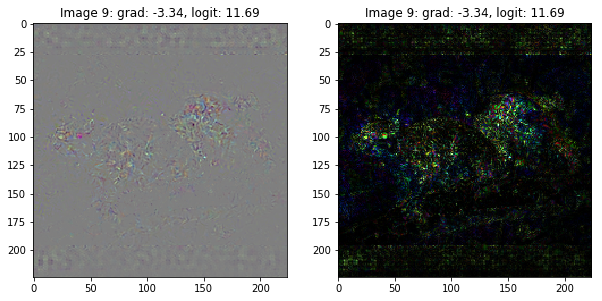

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


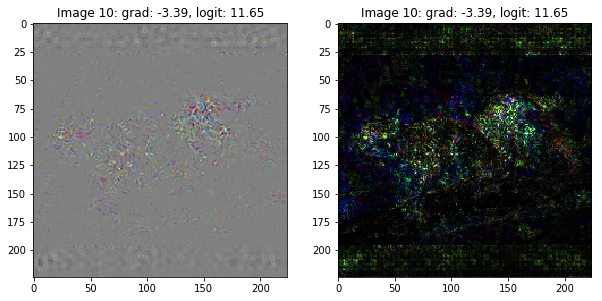

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


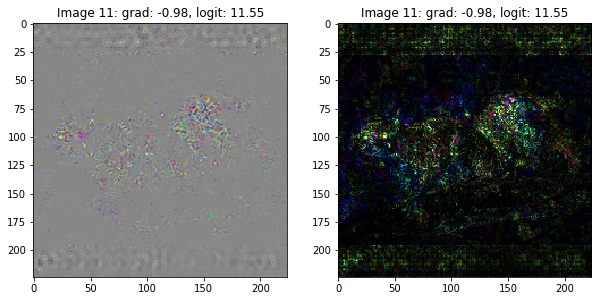

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


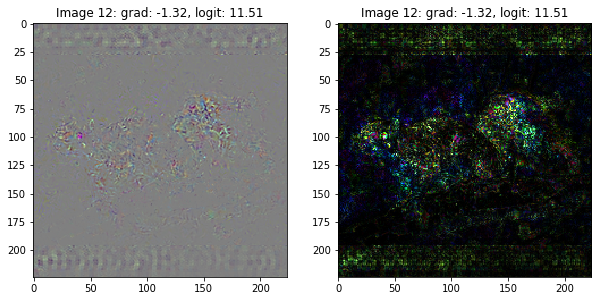

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


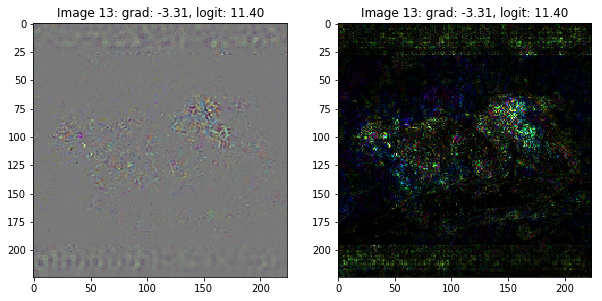

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


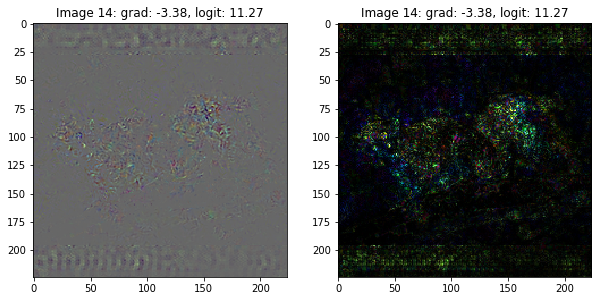

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


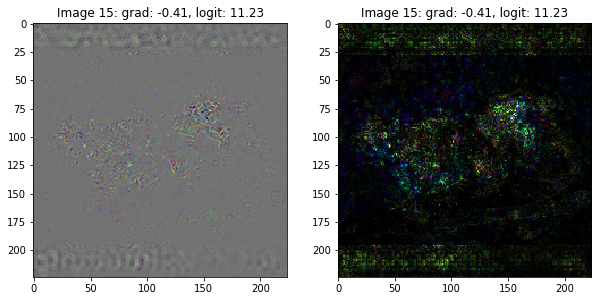

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


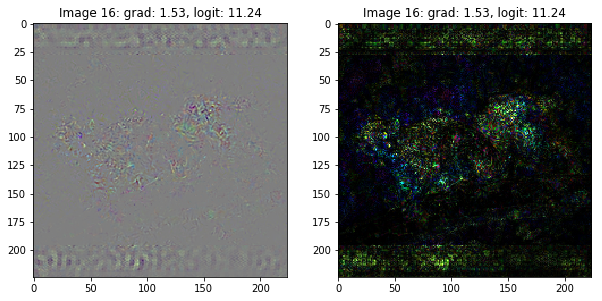

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


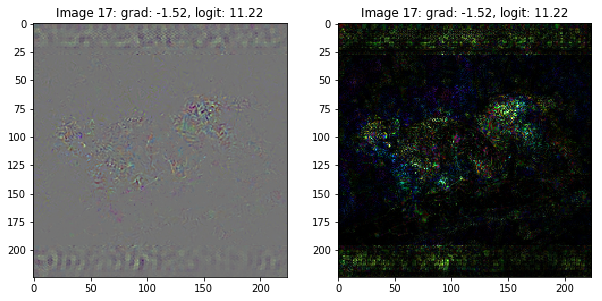

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


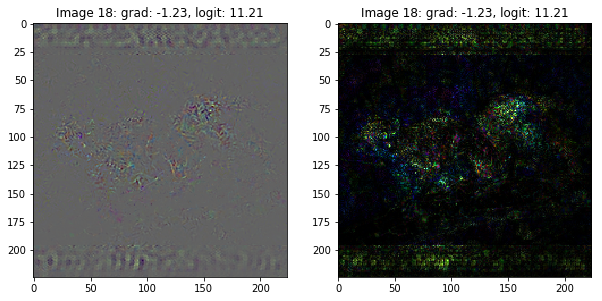

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


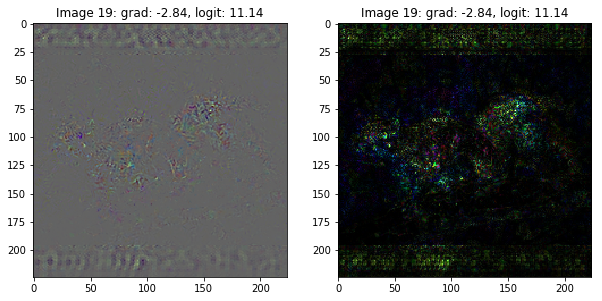

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


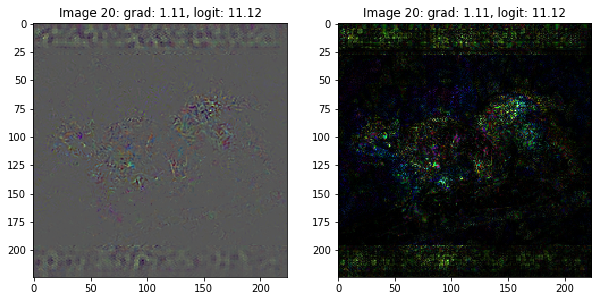

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


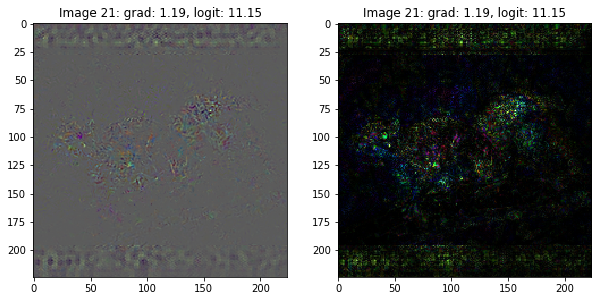

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


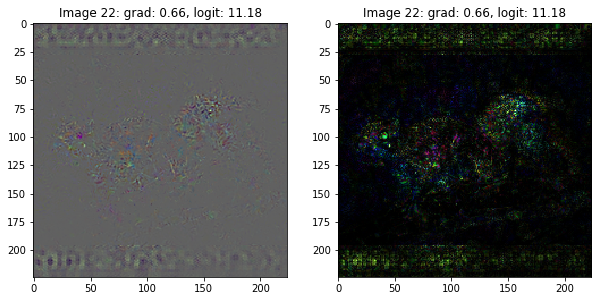

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


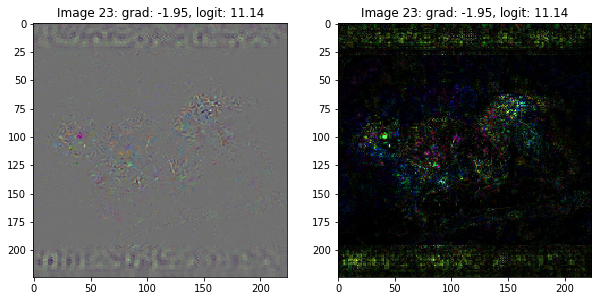

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


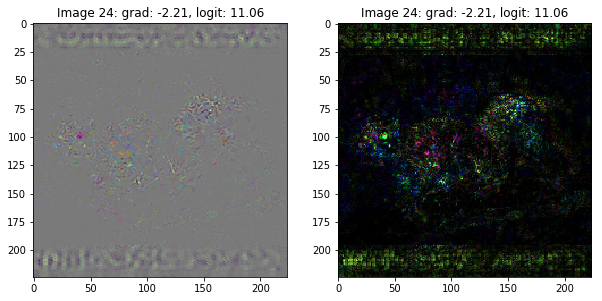

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


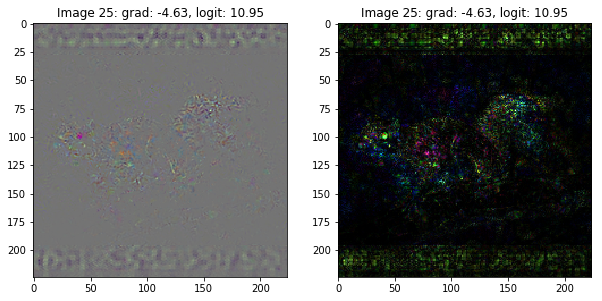

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


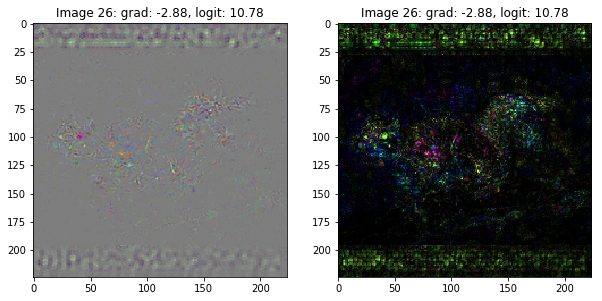

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


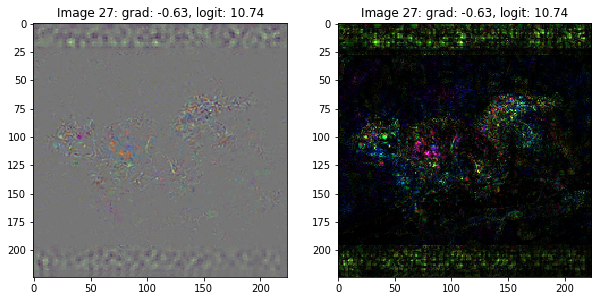

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


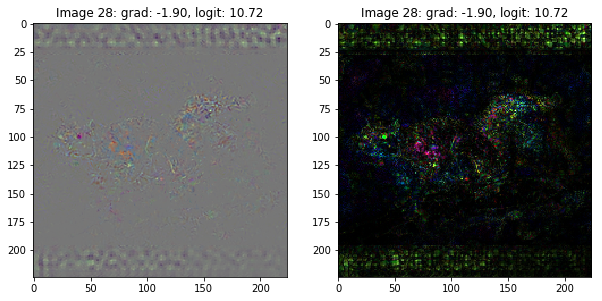

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


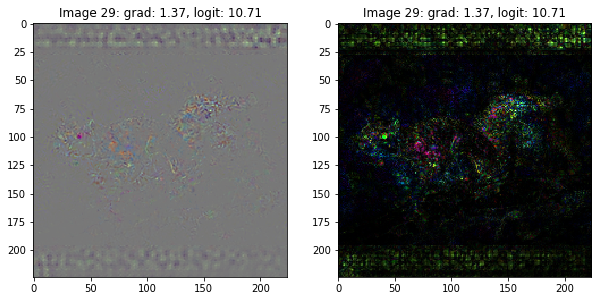

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


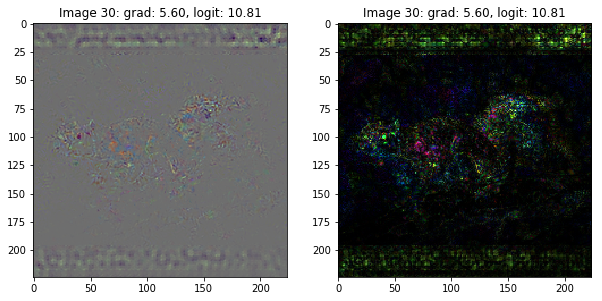

In [19]:
AMPLIFICATION = 2.0
INTERPOLATION = 'none'

gradients_and_logits = pickle.load(open(os.path.join(IMAGE_DIR, 'gradients_and_logits.pkl'), "rb" ))
for i in range(0, RIEMANN_STEPS + 1):
    gradient_map = pickle.load(open(os.path.join(IMAGE_DIR, 'path_gradient_' + str(i) + '.pkl'), "rb" ))
    min_grad = np.ndarray.min(gradient_map)
    max_grad = np.ndarray.max(gradient_map)
    median_grad = np.median(gradient_map)
    gradient_and_logit = gradients_and_logits[i]

    plt.figure(figsize=(10,10))
    plt.subplot(121)
    plt.title('Image %d: grad: %.2f, logit: %.2f' % (i, gradient_and_logit[0], gradient_and_logit[1]))
    imgplot = plt.imshow((gradient_map - min_grad) / (max_grad - min_grad),
                        interpolation=INTERPOLATION)
    plt.subplot(122)
    plt.title('Image %d: grad: %.2f, logit: %.2f' % (i, gradient_and_logit[0], gradient_and_logit[1]))
    imgplot = plt.imshow(np.abs(gradient_map - median_grad) * AMPLIFICATION / max(max_grad - median_grad, median_grad - min_grad),
                       interpolation=INTERPOLATION)
    plt.show()

## Plot the Integrated Gradient

When integrating over all gradients along the path, the result is an image that captures larger signals from pixels with the large gradients. Is the integrated gradient a clear representation of what it is trying to detect?

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


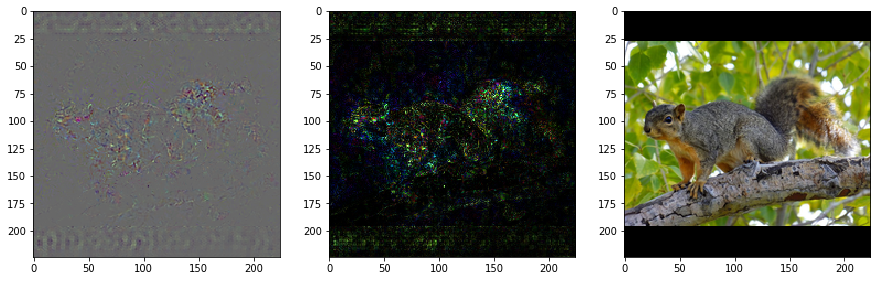

total logit diff: 11.770034
sum of integrated gradients: 13.807649


In [20]:
AMPLIFICATION = 2.0
INTERPOLATION = 'none'

# Plot the integrated gradients
int_gradients = pickle.load(open(os.path.join(IMAGE_DIR, 'int_gradients.pkl'), "rb" ))
min_grad = np.ndarray.min(int_gradients)
max_grad = np.ndarray.max(int_gradients)
median_grad = np.median(int_gradients)
plt.figure(figsize=(15,15))
plt.subplot(131)
imgplot = plt.imshow((int_gradients - min_grad) / (max_grad - min_grad),
                    interpolation=INTERPOLATION)
plt.subplot(132)
imgplot = plt.imshow(np.abs(int_gradients - median_grad) * AMPLIFICATION / max(max_grad - median_grad, median_grad - min_grad),
                        interpolation=INTERPOLATION)
plt.subplot(133)
imgplot = plt.imshow(feature[0])
plt.show()

# Verify that the average of gradients is equal to the difference in logits
print('total logit diff: %f' % (gradients_and_logits[RIEMANN_STEPS][1] - gradients_and_logits[0][1]))
print('sum of integrated gradients: %f' % (np.sum(int_gradients) / RIEMANN_STEPS + 1))

## Plot the integrated gradients for each channel

We can also visualize individual pixel contributions from different RGB channels.

Can you think of any other visualization ideas to try out?

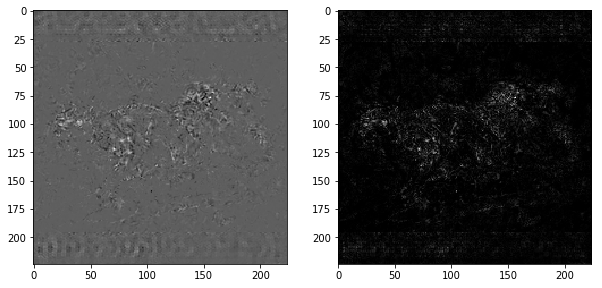

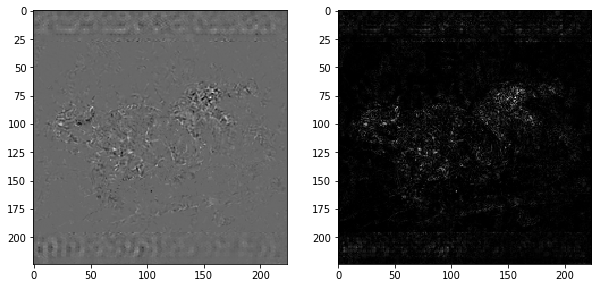

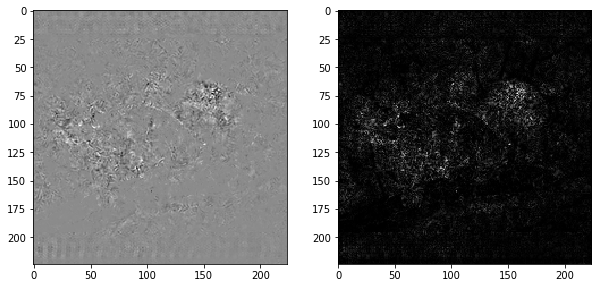

In [21]:
AMPLIFICATION = 2.0
INTERPOLATION = 'none'

# Show red-green-blue channels for integrated gradients
for channel in range(0, 3):
    gradient_channel = int_gradients[:,:,channel]
    min_grad = np.ndarray.min(gradient_channel)
    max_grad = np.ndarray.max(gradient_channel)
    median_grad = np.median(gradient_channel)
    plt.figure(figsize=(10,10))
    plt.subplot(121)
    imgplot = plt.imshow((gradient_channel - min_grad) / (max_grad - min_grad),
                         interpolation=INTERPOLATION,
                         cmap='gray')
    plt.subplot(122)
    imgplot = plt.imshow(np.abs(gradient_channel - median_grad) * AMPLIFICATION / max(max_grad - median_grad, median_grad - min_grad),
                         interpolation=INTERPOLATION,
                         cmap='gray')
    plt.show()